# Breath Detection — Dataset Exploration

This notebook:
1. Downloads **LibriTTS-R train-clean-100** (~8.1 GB)
2. Clones **Respiro-en** and downloads its pre-trained model
3. Visualises audio segments with detected breath regions overlaid

## 1 — Install dependencies

In [1]:
%pip install -q torch torchaudio librosa matplotlib intervaltree h5py numpy ipywidgets soundfile torchcodec

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 19.9 MB/s eta 0:00:00


## 2 — Clone Respiro-en and download the pre-trained model

In [2]:
from pathlib import Path

RESPIRO_DIR = Path("respiro-en")

SKIP_DOWNLOAD = False          # ← set True if you already have the data
DATA_DIR      = Path("data")
LIBRI_ROOT    = DATA_DIR / "LibriTTS-R"
ARCHIVE_PATH  = DATA_DIR / "train_clean_100.tar.gz"
DOWNLOAD_URL  = "https://openslr.trmal.net/resources/141/train_clean_100.tar.gz"

In [3]:
import os
import sys


if not RESPIRO_DIR.exists():
    !git clone --depth 1 https://github.com/ydqmkkx/Respiro-en respiro-en
else:
    print("Respiro-en already cloned.")

# Add to Python path so we can import modules.py
sys.path.insert(0, str(RESPIRO_DIR))
print("Files in respiro-en:", [f.name for f in RESPIRO_DIR.iterdir()])

Cloning into 'respiro-en'...
remote: Enumerating objects: 15, done.
remote: Counting objects: 100% (15/15), done.
remote: Compressing objects: 100% (15/15), done.
remote: Total 15 (delta 0), reused 1 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (15/15), 32.25 MiB | 20.05 MiB/s, done.
Files in respiro-en: ['demo.ipynb', '.git', 'LICENSE', 'README.md', 'datasets', 'model.png', 'samples', 'modules.py', 'respiro-en.pt']


## 3 — Download LibriTTS-R train-clean-100

> **Size: ~8.1 GB.** The cell below streams the archive with a progress bar.  
> Set `SKIP_DOWNLOAD = True` and point `LIBRI_ROOT` at an existing extraction if you already have it.

In [4]:
import urllib.request
import tarfile
import shutil

DATA_DIR.mkdir(exist_ok=True)

# --- Download -----------------------------------------------------------
def _reporthook(block_num, block_size, total_size):
    downloaded = block_num * block_size
    pct = min(100.0, 100 * downloaded / total_size) if total_size > 0 else 0
    mb  = downloaded / 1e6
    total_mb = total_size / 1e6
    print(f"\r  {pct:5.1f}%  {mb:.0f} / {total_mb:.0f} MB", end="", flush=True)

def download(url: Path, archive: Path, output_dir: Path, dataset_name: str = "dataset"):
    if not archive.exists():
        print(f"Downloading {url} ...")
        urllib.request.urlretrieve(url, archive, reporthook=_reporthook)
        print("\nDone.")
    else:
        print("Archive already present, skipping download.")

    # --- Extract --------------------------------------------------------
    if not (output_dir / dataset_name).exists():
        print("Extracting archive (this may take a few minutes) ...")
        with tarfile.open(archive, "r:gz") as tar:
            tar.extractall(output_dir)
        print("Extraction complete.")
    else:
        print(f"{dataset_name} already extracted.")

if not SKIP_DOWNLOAD:
    download(DOWNLOAD_URL, ARCHIVE_PATH, LIBRI_ROOT, "train-clean-100")
else:
    print(f"Skipping download. Using existing data at {LIBRI_ROOT}")

  100.0%  8130 / 8130 MB
Done.
Extracting archive (this may take a few minutes) ...


/tmp/ipykernel_1494/3344922496.py:27: DeprecationWarning: Python 3.14 will, by default, filter extracted tar archives and reject files or modify their metadata. Use the filter argument to control this behavior.
  tar.extractall(output_dir)


Extraction complete.


In [5]:
SPLIT_DIR = LIBRI_ROOT / "LibriTTS_R" /"train-clean-100"
wav_files = sorted(SPLIT_DIR.rglob("*.wav"))
print(f"\nFound {len(wav_files):,} WAV files.")


Found 33,232 WAV files.


## 4 — Load Respiro-en breath detector

In [6]:
import torch
from modules import DetectionNet, BreathDetector   # from respiro-en/modules.py

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {DEVICE}")

MODEL_PATH = RESPIRO_DIR / "respiro-en.pt"
model = DetectionNet().to(DEVICE)
ckpt  = torch.load(MODEL_PATH, map_location=DEVICE)
model.load_state_dict(ckpt["model"])
model.eval()

detector = BreathDetector(model)
print("Model loaded successfully.")

Using device: cpu
Model loaded successfully.


## 5 — Dataset overview

Speakers  : 247
Utterances: 33,232


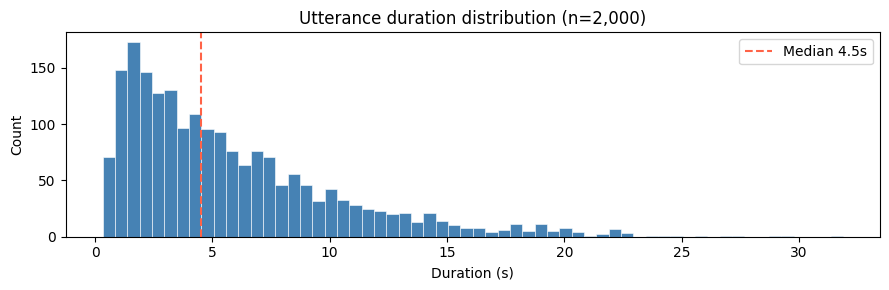

Mean: 5.82s  |  Median: 4.52s  |  Max: 31.88s


In [7]:
import random
import torchaudio
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from IPython.display import Audio, display
import soundfile as sf

random.seed(42)

# Collect speaker info
speakers = sorted({p.parts[-3] for p in wav_files})
print(f"Speakers  : {len(speakers):,}")
print(f"Utterances: {len(wav_files):,}")

# Duration distribution over a 2000-utterance sample
sample_files = random.sample(wav_files, min(2000, len(wav_files)))
durations = []
for p in sample_files:
    info = sf.info(str(p))
    durations.append(info.frames / info.samplerate)

fig, ax = plt.subplots(figsize=(9, 3))
ax.hist(durations, bins=60, color="steelblue", edgecolor="white", linewidth=0.4)
ax.set_xlabel("Duration (s)")
ax.set_ylabel("Count")
ax.set_title(f"Utterance duration distribution (n={len(sample_files):,})")
ax.axvline(np.median(durations), color="tomato", linestyle="--", label=f"Median {np.median(durations):.1f}s")
ax.legend()
plt.tight_layout()
plt.show()
print(f"Mean: {np.mean(durations):.2f}s  |  Median: {np.median(durations):.2f}s  |  Max: {np.max(durations):.2f}s")

## 6 — Visualise segments with breath detection

For each sampled utterance we show:
- Waveform with breath regions shaded
- Log-Mel spectrogram with breath regions shaded
- Playable audio widget

In [8]:
import librosa
import librosa.display
from intervaltree import IntervalTree

# ---- Helpers -----------------------------------------------------------

def load_audio(path: str, target_sr: int = 16000):
    """Load and resample to target_sr. Returns (waveform np array, sr)."""
    wav, sr = librosa.load(path)
    wav = torch.from_numpy(wav)
    if sr != target_sr:
        wav = torchaudio.functional.resample(wav, sr, target_sr)
    return wav.squeeze(0).numpy(), target_sr


def shade_breaths(ax, tree: IntervalTree, ymin=0, ymax=1, alpha=0.25):
    """Draw translucent red spans over detected breath regions."""
    for iv in sorted(tree):
        ax.axvspan(iv.begin, iv.end, ymin=ymin, ymax=ymax,
                   color="tomato", alpha=alpha, linewidth=0)


def plot_segment(audio_path: str, title: str = ""):
    """
    Run breath detection and produce a 2-panel figure:
      top    — waveform
      bottom — log-mel spectrogram
    Breath regions are highlighted in both panels.
    """
    # --- Breath detection -----------------------------------------------
    tree = detector(audio_path)
    breath_intervals = sorted(tree)

    # --- Audio ----------------------------------------------------------
    wave, sr = load_audio(audio_path)
    duration  = len(wave) / sr
    times     = np.linspace(0, duration, len(wave))

    # --- Mel spectrogram ------------------------------------------------
    n_fft    = 600   # 25 ms @ 24 kHz
    hop      = 240   # 10 ms @ 24 kHz
    mel      = librosa.feature.melspectrogram(y=wave, sr=sr,
                                               n_fft=n_fft, hop_length=hop,
                                               n_mels=80, fmax=8000)
    log_mel  = librosa.power_to_db(mel, ref=np.max)

    # --- Figure ---------------------------------------------------------
    fig, axes = plt.subplots(2, 1, figsize=(13, 5),
                              gridspec_kw={"height_ratios": [1, 2]})
    fig.suptitle(title or Path(audio_path).stem, fontsize=11, y=1.01)

    # Waveform
    ax0 = axes[0]
    ax0.plot(times, wave, color="#4a90d9", linewidth=0.4, rasterized=True)
    ax0.set_xlim(0, duration)
    ax0.set_ylabel("Amplitude")
    ax0.set_xlabel("")
    ax0.tick_params(labelbottom=False)
    shade_breaths(ax0, tree)

    # Mel spectrogram
    ax1 = axes[1]
    img = librosa.display.specshow(log_mel, sr=sr, hop_length=hop,
                                    x_axis="time", y_axis="mel",
                                    fmax=8000, ax=ax1, cmap="magma")
    fig.colorbar(img, ax=ax1, format="%+2.0f dB", pad=0.01)
    ax1.set_xlabel("Time (s)")
    shade_breaths(ax1, tree)

    # Legend proxy
    from matplotlib.patches import Patch
    legend_handle = Patch(color="tomato", alpha=0.5, label="Breath")
    ax0.legend(handles=[legend_handle], loc="upper right", fontsize=8)

    plt.tight_layout()
    plt.show()

    # Breath summary
    total_breath = sum(iv.end - iv.begin for iv in breath_intervals)
    print(f"  Duration: {duration:.2f}s  |  "
          f"Breaths detected: {len(breath_intervals)}  |  "
          f"Total breath time: {total_breath:.2f}s ({100*total_breath/duration:.1f}%)")
    if breath_intervals:
        print("  Intervals (s):", [(round(iv.begin,2), round(iv.end,2)) for iv in breath_intervals])

    # Audio widget
    display(Audio(wave, rate=sr))
    print()

print("Helper functions defined.")

Helper functions defined.


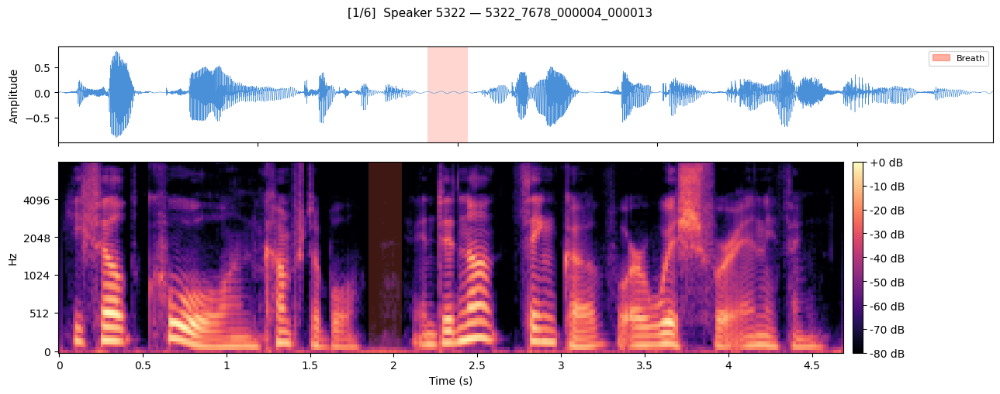

  Duration: 4.68s  |  Breaths detected: 1  |  Total breath time: 0.20s (4.3%)
  Intervals (s): [(np.float64(1.85), np.float64(2.05))]


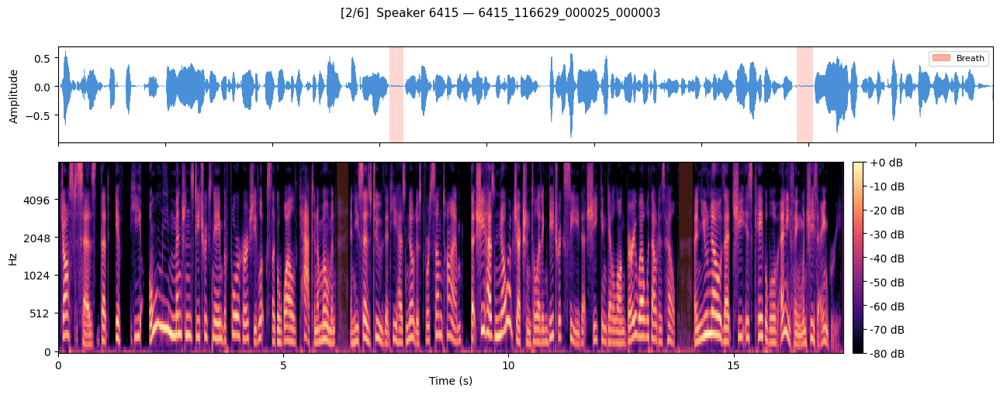

  Duration: 17.44s  |  Breaths detected: 2  |  Total breath time: 0.56s (3.2%)
  Intervals (s): [(np.float64(6.19), np.float64(6.44)), (np.float64(13.78), np.float64(14.09))]


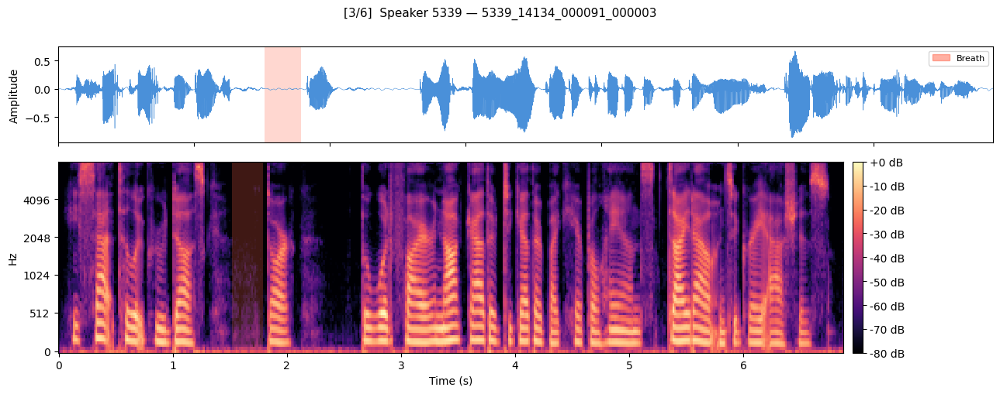

  Duration: 6.88s  |  Breaths detected: 1  |  Total breath time: 0.27s (3.9%)
  Intervals (s): [(np.float64(1.52), np.float64(1.79))]


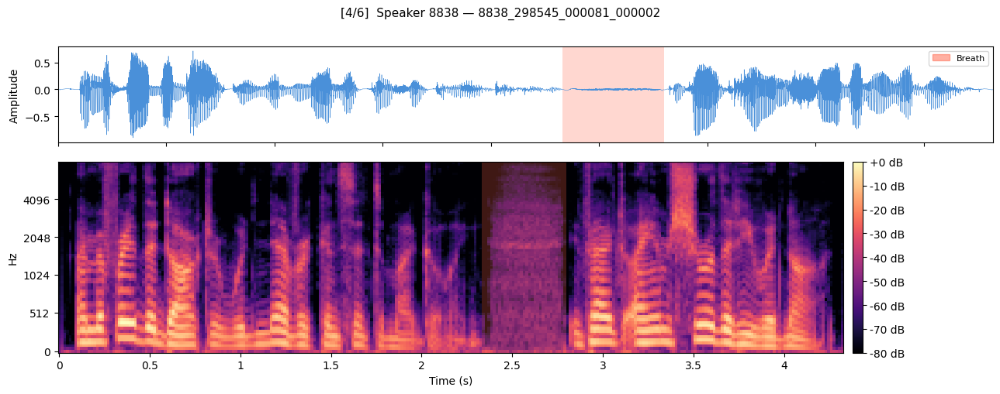

  Duration: 4.32s  |  Breaths detected: 1  |  Total breath time: 0.47s (10.9%)
  Intervals (s): [(np.float64(2.33), np.float64(2.8))]


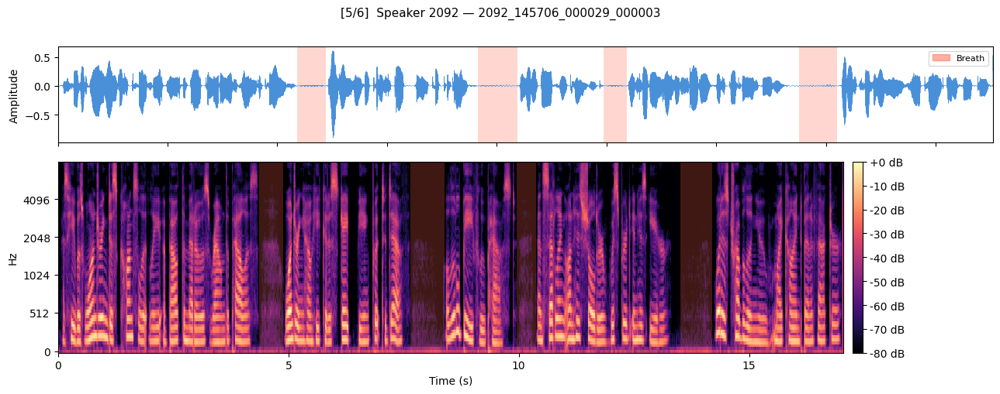

  Duration: 17.04s  |  Breaths detected: 4  |  Total breath time: 2.37s (13.9%)
  Intervals (s): [(np.float64(4.36), np.float64(4.89)), (np.float64(7.65), np.float64(8.38)), (np.float64(9.95), np.float64(10.37)), (np.float64(13.51), np.float64(14.2))]


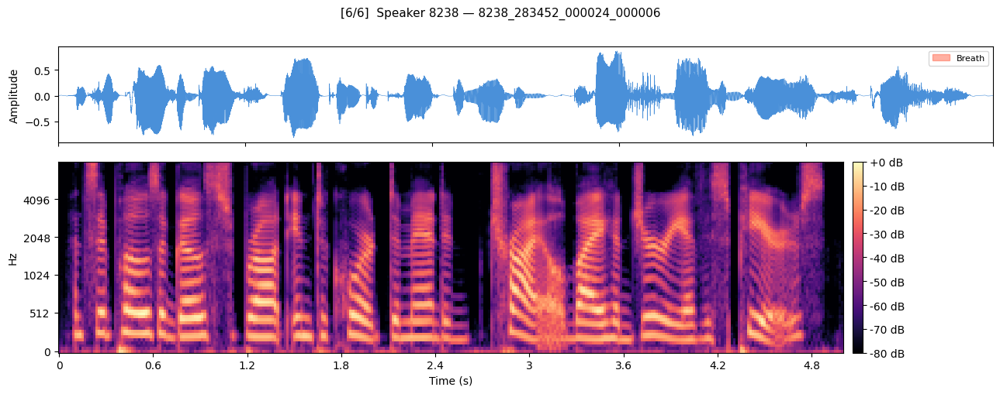

  Duration: 5.00s  |  Breaths detected: 0  |  Total breath time: 0.00s (0.0%)


In [9]:
# Sample N_SHOW random utterances and visualise them
N_SHOW = 6

# Filter to utterances >= 4 s for interesting content
candidates = [
    p for p in sample_files
    if sf.info(str(p)).frames / sf.info(str(p)).samplerate >= 4.0
]
show_files = random.sample(candidates, min(N_SHOW, len(candidates)))

for i, path in enumerate(show_files):
    spk = path.parts[-3]
    plot_segment(str(path), title=f"[{i+1}/{N_SHOW}]  Speaker {spk} — {path.stem}")

## 7 — Aggregate breath statistics across a larger sample

In [10]:
N_STATS = 200   # number of utterances to analyse

stat_files = random.sample(candidates, min(N_STATS, len(candidates)))

records = []
for i, path in enumerate(stat_files):
    if i % 20 == 0:
        print(f"  {i}/{len(stat_files)} ...", flush=True)
    wav_info = sf.info(str(path))
    duration = wav_info.frames / wav_info.samplerate
    tree     = detector(str(path))
    ivs      = sorted(tree)
    total_breath = sum(iv.end - iv.begin for iv in ivs)
    records.append({
        "duration":      duration,
        "n_breaths":     len(ivs),
        "breath_time":   total_breath,
        "breath_ratio":  total_breath / duration if duration > 0 else 0,
        "mean_breath_len": np.mean([iv.end - iv.begin for iv in ivs]) if ivs else 0,
    })

print(f"\nProcessed {len(records)} utterances.")

  0/200 ...
  20/200 ...
  40/200 ...
  60/200 ...
  80/200 ...
  100/200 ...
  120/200 ...
  140/200 ...
  160/200 ...
  180/200 ...

Processed 200 utterances.


,duration,n_breaths,breath_time,breath_ratio,mean_breath_len
count,200.000,200.000,200.000,200.000,200.000
mean,9.183,1.430,0.594,0.056,0.295
std,4.749,1.451,0.654,0.045,0.218
min,4.000,0.000,0.000,0.000,0.000
25%,5.740,0.000,0.000,0.000,0.000
50%,7.680,1.000,0.440,0.058,0.340
75%,11.430,2.000,0.832,0.086,0.441
max,29.760,7.000,3.890,0.190,0.990


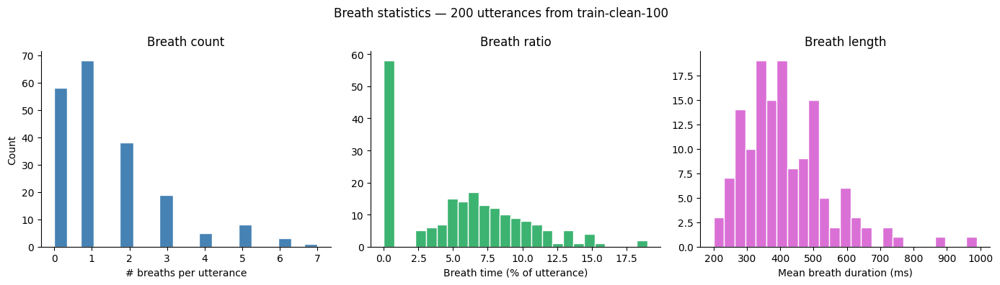

In [11]:
import pandas as pd

df = pd.DataFrame(records)
display(df.describe().round(3))

fig, axes = plt.subplots(1, 3, figsize=(14, 4))

axes[0].hist(df["n_breaths"], bins=20, color="steelblue", edgecolor="white")
axes[0].set_xlabel("# breaths per utterance")
axes[0].set_ylabel("Count")
axes[0].set_title("Breath count")

axes[1].hist(df["breath_ratio"] * 100, bins=25, color="mediumseagreen", edgecolor="white")
axes[1].set_xlabel("Breath time (% of utterance)")
axes[1].set_title("Breath ratio")

mask = df["mean_breath_len"] > 0
axes[2].hist(df.loc[mask, "mean_breath_len"] * 1000, bins=25, color="orchid", edgecolor="white")
axes[2].set_xlabel("Mean breath duration (ms)")
axes[2].set_title("Breath length")

for ax in axes:
    ax.spines[["top", "right"]].set_visible(False)

fig.suptitle(f"Breath statistics — {len(df)} utterances from train-clean-100", fontsize=12)
plt.tight_layout()
plt.show()

## 8 — Per-speaker breath rate comparison

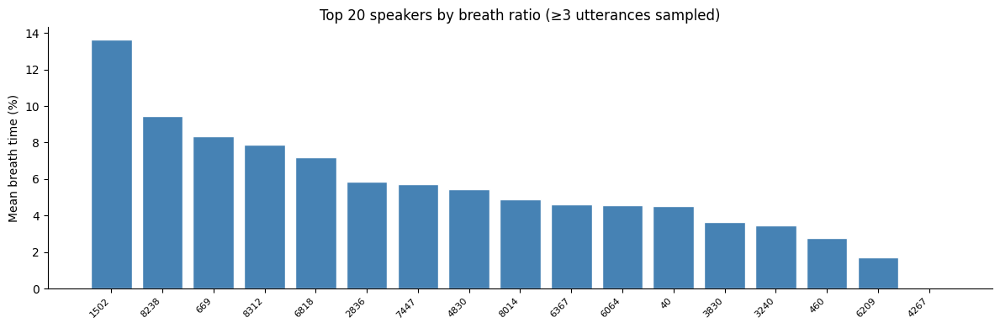

,n_utts,mean_breath_ratio,mean_n_breaths
speaker_id,,,
1502,4,0.136365,2.750000
8238,3,0.094705,2.333333
669,3,0.083534,1.333333
8312,3,0.078651,2.000000
6818,3,0.071829,1.333333
2836,3,0.058422,1.333333
7447,3,0.057074,1.666667
4830,3,0.054476,1.666667
8014,5,0.048720,1.200000


In [12]:
# Attach speaker ID to each record and compare breath rates across speakers
for rec, path in zip(records, stat_files):
    rec["speaker_id"] = path.parts[-3]

df = pd.DataFrame(records)

# Focus on speakers with ≥ 3 utterances sampled
spk_counts = df.groupby("speaker_id").size()
active_spks = spk_counts[spk_counts >= 3].index
df_spk = df[df["speaker_id"].isin(active_spks)]

spk_stats = (
    df_spk.groupby("speaker_id")
    .agg(n_utts=("duration", "count"),
         mean_breath_ratio=("breath_ratio", "mean"),
         mean_n_breaths=("n_breaths", "mean"))
    .sort_values("mean_breath_ratio", ascending=False)
    .head(20)
)

fig, ax = plt.subplots(figsize=(12, 4))
bars = ax.bar(range(len(spk_stats)), spk_stats["mean_breath_ratio"] * 100,
              color="steelblue", edgecolor="white")
ax.set_xticks(range(len(spk_stats)))
ax.set_xticklabels(spk_stats.index, rotation=45, ha="right", fontsize=8)
ax.set_ylabel("Mean breath time (%)")
ax.set_title("Top 20 speakers by breath ratio (≥3 utterances sampled)")
ax.spines[["top", "right"]].set_visible(False)
plt.tight_layout()
plt.show()

display(spk_stats)

# Evaluate Other Datasets

In [13]:
AISHELL4_FILENAME = "test.tar.gz"
AISHELL4_URL = f"https://openslr.trmal.net/resources/111/{AISHELL4_FILENAME}"
AISHELL4_ROOT = DATA_DIR / "Aishell_4"

if True:
  download(AISHELL4_URL, DATA_DIR / AISHELL4_FILENAME, AISHELL4_ROOT, "test")

  100.0%  5241 / 5241 MB
Done.
Extracting archive (this may take a few minutes) ...


/tmp/ipykernel_1494/3344922496.py:27: DeprecationWarning: Python 3.14 will, by default, filter extracted tar archives and reject files or modify their metadata. Use the filter argument to control this behavior.
  tar.extractall(output_dir)


Extraction complete.


In [14]:
SPLIT_DIR = AISHELL4_ROOT / "test"
wav_files_a = sorted(SPLIT_DIR.rglob("*.flac"))
print(f"\nFound {len(wav_files_a):,} WAV files.")


Found 20 WAV files.


Speakers  : 1
Utterances: 33,232


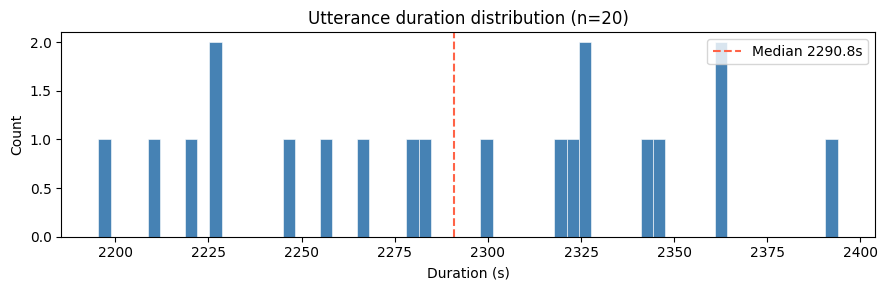

Mean: 2290.55s  |  Median: 2290.80s  |  Max: 2393.93s


In [15]:
import random
import torchaudio
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from IPython.display import Audio, display
import soundfile as sf

random.seed(42)

# Collect speaker info
speakers = sorted({p.parts[-3] for p in wav_files_a})
print(f"Speakers  : {len(speakers):,}")
print(f"Utterances: {len(wav_files):,}")

# Duration distribution over a 2000-utterance sample
sample_files_a = random.sample(wav_files_a, min(2000, len(wav_files_a)))
durations = []
for p in sample_files_a:
    info = sf.info(str(p))
    durations.append(info.frames / info.samplerate)

fig, ax = plt.subplots(figsize=(9, 3))
ax.hist(durations, bins=60, color="steelblue", edgecolor="white", linewidth=0.4)
ax.set_xlabel("Duration (s)")
ax.set_ylabel("Count")
ax.set_title(f"Utterance duration distribution (n={len(sample_files_a):,})")
ax.axvline(np.median(durations), color="tomato", linestyle="--", label=f"Median {np.median(durations):.1f}s")
ax.legend()
plt.tight_layout()
plt.show()
print(f"Mean: {np.mean(durations):.2f}s  |  Median: {np.median(durations):.2f}s  |  Max: {np.max(durations):.2f}s")

In [16]:
import librosa
import librosa.display
from intervaltree import IntervalTree

# ---- Helpers -----------------------------------------------------------

def load_audio(path: str, target_sr: int = 16000, duration=1000):
    """Load and resample to target_sr. Returns (waveform np array, sr)."""
    wav, sr = librosa.load(path, offset=1500, duration=20)
    wav = torch.from_numpy(wav)
    if sr != target_sr:
        wav = torchaudio.functional.resample(wav, sr, target_sr)
    return wav.squeeze(0).numpy(), target_sr


def shade_breaths(ax, tree: IntervalTree, ymin=0, ymax=1, alpha=0.25):
    """Draw translucent red spans over detected breath regions."""
    for iv in sorted(tree):
        ax.axvspan(iv.begin, iv.end, ymin=ymin, ymax=ymax,
                   color="tomato", alpha=alpha, linewidth=0)


def plot_segment(breath_preds, wave: np.array = [], sr: int = 16000,
                 title: str = ""):
    """
    Run breath detection and produce a 2-panel figure:
      top    — waveform
      bottom — log-mel spectrogram
    Breath regions are highlighted in both panels.
    """
    # --- Breath detection -----------------------------------------------

    breath_intervals = sorted(breath_preds)

    # --- Audio ----------------------------------------------------------
    #wave, sr = load_audio(audio_path) if audio_path != "" else audio
    duration  = len(wave) / sr
    times     = np.linspace(0, duration, len(wave))

    # --- Mel spectrogram ------------------------------------------------
    n_fft    = 600   # 25 ms @ 24 kHz
    hop      = 240   # 10 ms @ 24 kHz
    mel      = librosa.feature.melspectrogram(y=wave, sr=sr,
                                               n_fft=n_fft, hop_length=hop,
                                               n_mels=80, fmax=8000)
    log_mel  = librosa.power_to_db(mel, ref=np.max)

    # --- Figure ---------------------------------------------------------
    fig, axes = plt.subplots(2, 1, figsize=(13, 5),
                              gridspec_kw={"height_ratios": [1, 2]})
    fig.suptitle(title, fontsize=11, y=1.01)

    # Waveform
    ax0 = axes[0]
    ax0.plot(times, wave, color="#4a90d9", linewidth=0.4, rasterized=True)
    ax0.set_xlim(0, duration)
    ax0.set_ylabel("Amplitude")
    ax0.set_xlabel("")
    ax0.tick_params(labelbottom=False)
    shade_breaths(ax0, breath_preds)

    # Mel spectrogram
    ax1 = axes[1]
    img = librosa.display.specshow(log_mel, sr=sr, hop_length=hop,
                                    x_axis="time", y_axis="mel",
                                    fmax=8000, ax=ax1, cmap="magma")
    fig.colorbar(img, ax=ax1, format="%+2.0f dB", pad=0.01)
    ax1.set_xlabel("Time (s)")
    shade_breaths(ax1, breath_preds)

    # Legend proxy
    from matplotlib.patches import Patch
    legend_handle = Patch(color="tomato", alpha=0.5, label="Breath")
    ax0.legend(handles=[legend_handle], loc="upper right", fontsize=8)

    plt.tight_layout()
    plt.show()

    # Breath summary
    total_breath = sum(iv.end - iv.begin for iv in breath_intervals)
    print(f"  Duration: {duration:.2f}s  |  "
          f"Breaths detected: {len(breath_intervals)}  |  "
          f"Total breath time: {total_breath:.2f}s ({100*total_breath/duration:.1f}%)")
    if breath_intervals:
        print("  Intervals (s):", [(round(iv.begin,2), round(iv.end,2)) for iv in breath_intervals])

    # Audio widget
    display(Audio(wave, rate=sr))
    print()

print("Helper functions defined.")

Helper functions defined.


In [17]:
from modules import feature_extractor
from intervaltree import Interval


class TrimmedBreathDetector:
    def __init__(self, model, device=None):
        super().__init__()
        self.model = model
        if not device:
            self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        else:
            self.device = device

    def __call__(self, wav_path, threshold=0.064, min_length=20):
        wav, sr = librosa.load(wav_path, sr=16000, offset=1500, duration=20)
        feature, length = feature_extractor(wav, sr)
        feature, length = feature.to(self.device), length.to(self.device)
        output = self.model(feature, length)

        prediction = (output[0] > threshold).nonzero().squeeze().tolist()
        tree = IntervalTree()
        if isinstance(prediction, list) and len(prediction)>1:
            diffs = np.diff(prediction)
            splits = np.where(diffs != 1)[0] + 1
            splits = np.split(prediction, splits)
            splits = list(filter(lambda split: len(split)>min_length, splits))
            for split in splits:
                if split[-1]*0.01>split[0]*0.01:
                    tree.add(Interval(round(split[0]*0.01, 2), round(split[-1]*0.01, 2)))
        return tree

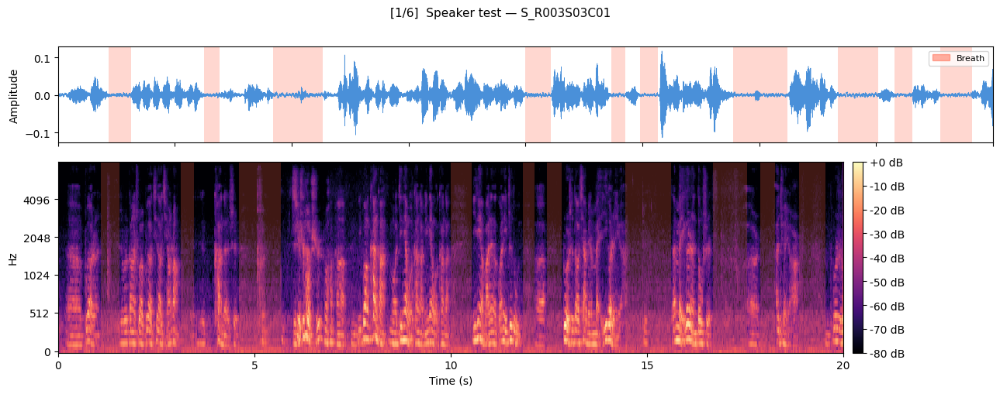

  Duration: 20.00s  |  Breaths detected: 10  |  Total breath time: 6.18s (30.9%)
  Intervals (s): [(np.float64(1.09), np.float64(1.56)), (np.float64(3.13), np.float64(3.46)), (np.float64(4.61), np.float64(5.67)), (np.float64(10.0), np.float64(10.54)), (np.float64(11.83), np.float64(12.14)), (np.float64(12.45), np.float64(12.83)), (np.float64(14.44), np.float64(15.61)), (np.float64(16.68), np.float64(17.55)), (np.float64(17.89), np.float64(18.27)), (np.float64(18.88), np.float64(19.55))]


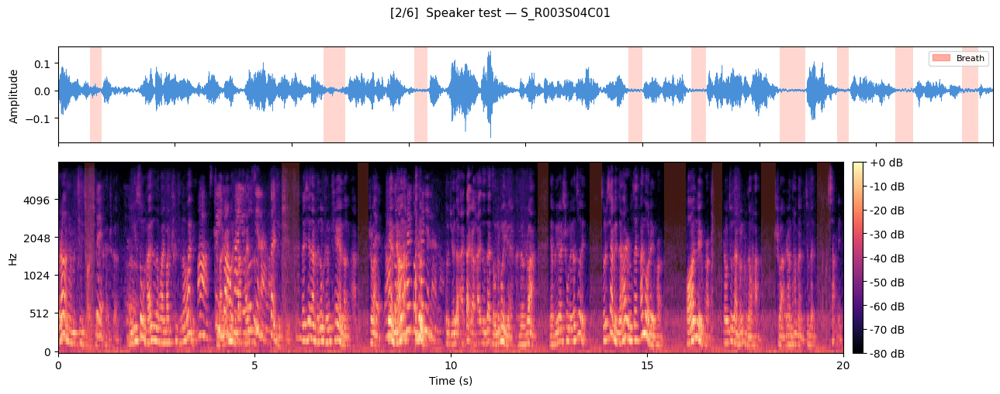

  Duration: 20.00s  |  Breaths detected: 9  |  Total breath time: 3.14s (15.7%)
  Intervals (s): [(np.float64(0.68), np.float64(0.93)), (np.float64(5.69), np.float64(6.15)), (np.float64(7.63), np.float64(7.91)), (np.float64(12.21), np.float64(12.5)), (np.float64(13.54), np.float64(13.86)), (np.float64(15.44), np.float64(15.98)), (np.float64(16.66), np.float64(16.92)), (np.float64(17.91), np.float64(18.29)), (np.float64(19.33), np.float64(19.69))]


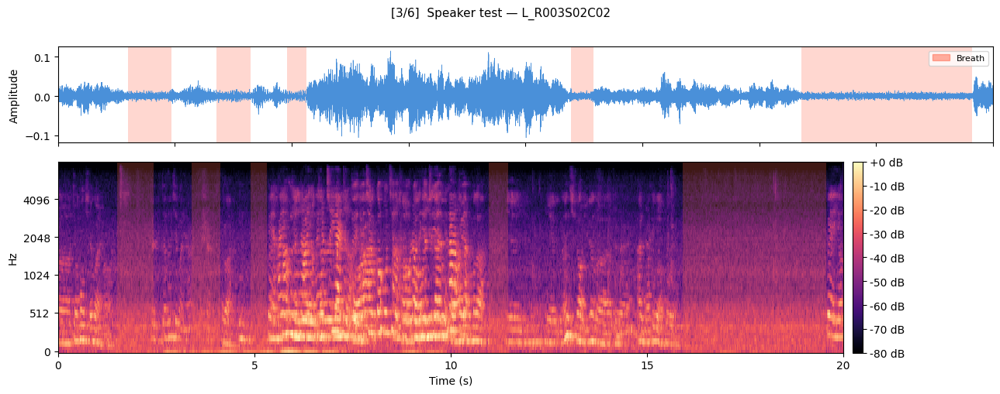

  Duration: 20.00s  |  Breaths detected: 5  |  Total breath time: 6.22s (31.1%)
  Intervals (s): [(np.float64(1.5), np.float64(2.43)), (np.float64(3.4), np.float64(4.13)), (np.float64(4.9), np.float64(5.32)), (np.float64(10.97), np.float64(11.46)), (np.float64(15.91), np.float64(19.56))]


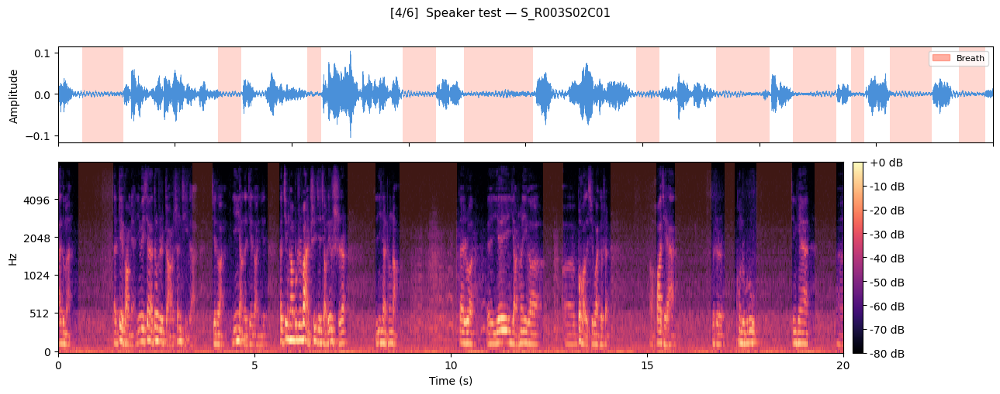

  Duration: 20.00s  |  Breaths detected: 11  |  Total breath time: 8.16s (40.8%)
  Intervals (s): [(np.float64(0.52), np.float64(1.4)), (np.float64(3.43), np.float64(3.93)), (np.float64(5.33), np.float64(5.63)), (np.float64(7.38), np.float64(8.08)), (np.float64(8.69), np.float64(10.16)), (np.float64(12.36), np.float64(12.86)), (np.float64(14.08), np.float64(15.23)), (np.float64(15.72), np.float64(16.65)), (np.float64(16.97), np.float64(17.24)), (np.float64(17.79), np.float64(18.69)), (np.float64(19.27), np.float64(19.83))]


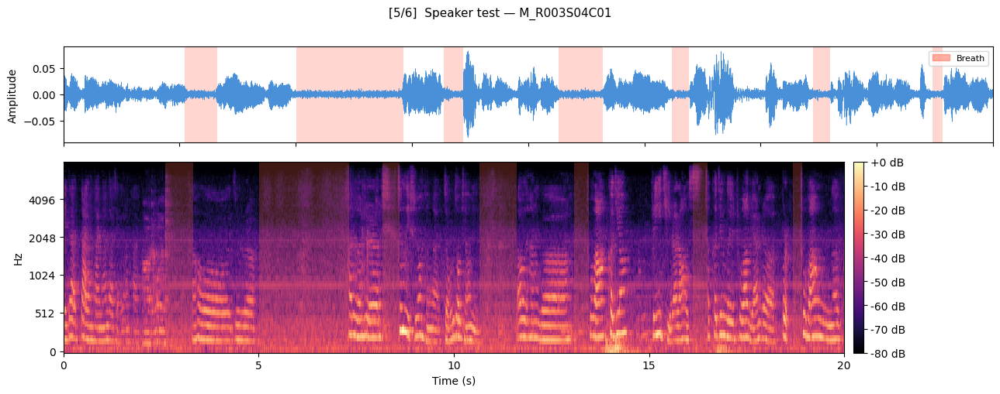

  Duration: 20.00s  |  Breaths detected: 7  |  Total breath time: 5.33s (26.6%)
  Intervals (s): [(np.float64(2.61), np.float64(3.32)), (np.float64(5.02), np.float64(7.31)), (np.float64(8.18), np.float64(8.6)), (np.float64(10.66), np.float64(11.61)), (np.float64(13.09), np.float64(13.46)), (np.float64(16.13), np.float64(16.49)), (np.float64(18.69), np.float64(18.92))]


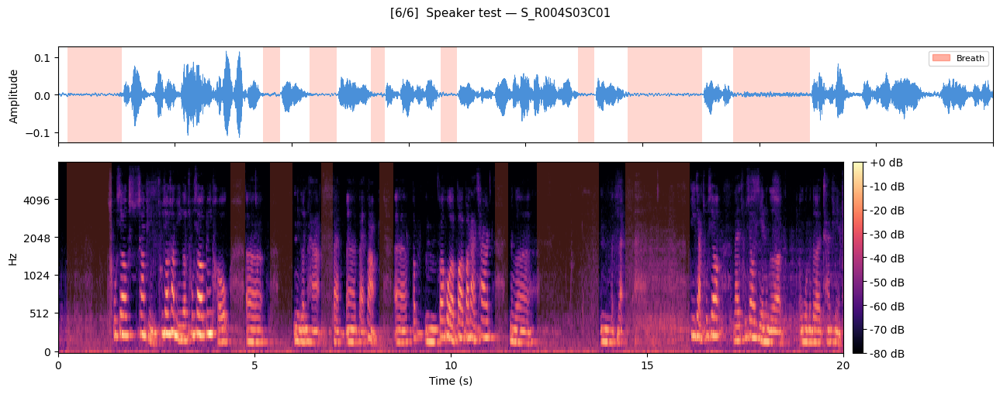

  Duration: 20.00s  |  Breaths detected: 8  |  Total breath time: 6.32s (31.6%)
  Intervals (s): [(np.float64(0.21), np.float64(1.37)), (np.float64(4.38), np.float64(4.76)), (np.float64(5.39), np.float64(5.96)), (np.float64(6.7), np.float64(6.99)), (np.float64(8.18), np.float64(8.53)), (np.float64(11.13), np.float64(11.47)), (np.float64(12.19), np.float64(13.78)), (np.float64(14.45), np.float64(16.09))]


In [18]:
N_SHOW = 6

# Filter to utterances >= 4 s for interesting content

tbd = TrimmedBreathDetector(model)
show_files = random.sample(sample_files_a, min(N_SHOW, len(sample_files_a)))

for i, path in enumerate(show_files):
    spk = path.parts[-3]
    breath_preds = tbd(path)
    wave, sr = load_audio(str(path))
    plot_segment(breath_preds, wave, sr, title=f"[{i+1}/{N_SHOW}]  Speaker {spk} — {path.stem}")

In [19]:
N_STATS = 200   # number of utterances to analyse
candidates_a = [
    p for p in sample_files_a
    if sf.info(str(p)).frames / sf.info(str(p)).samplerate >= 4.0
]
stat_files = random.sample(candidates_a, min(N_STATS, len(candidates_a)))

records = []
for i, path in enumerate(stat_files):
    if i % 20 == 0:
        print(f"  {i}/{len(stat_files)} ...", flush=True)
    wav_info = sf.info(str(path))
    duration = wav_info.frames / wav_info.samplerate
    tree     = tbd(str(path))
    ivs      = sorted(tree)
    total_breath = sum(iv.end - iv.begin for iv in ivs)
    records.append({
        "duration":      duration,
        "n_breaths":     len(ivs),
        "breath_time":   total_breath,
        "breath_ratio":  total_breath / duration if duration > 0 else 0,
        "mean_breath_len": np.mean([iv.end - iv.begin for iv in ivs]) if ivs else 0,
    })

print(f"\nProcessed {len(records)} utterances.")

  0/20 ...

Processed 20 utterances.


,duration,n_breaths,breath_time,breath_ratio,mean_breath_len
count,20.000,20.000,20.000,20.000,20.000
mean,2290.555,7.000,4.461,0.002,0.613
std,57.635,2.991,2.515,0.001,0.231
min,2195.433,1.000,0.300,0.000,0.300
25%,2241.973,5.000,3.100,0.001,0.443
50%,2290.803,7.000,4.420,0.002,0.628
75%,2330.643,9.000,5.858,0.003,0.747
max,2393.927,12.000,10.680,0.005,1.244


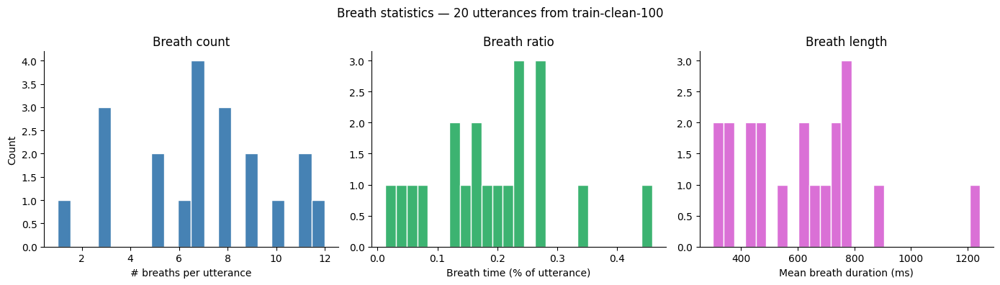

In [20]:
import pandas as pd

df = pd.DataFrame(records)
display(df.describe().round(3))

fig, axes = plt.subplots(1, 3, figsize=(14, 4))

axes[0].hist(df["n_breaths"], bins=20, color="steelblue", edgecolor="white")
axes[0].set_xlabel("# breaths per utterance")
axes[0].set_ylabel("Count")
axes[0].set_title("Breath count")

axes[1].hist(df["breath_ratio"] * 100, bins=25, color="mediumseagreen", edgecolor="white")
axes[1].set_xlabel("Breath time (% of utterance)")
axes[1].set_title("Breath ratio")

mask = df["mean_breath_len"] > 0
axes[2].hist(df.loc[mask, "mean_breath_len"] * 1000, bins=25, color="orchid", edgecolor="white")
axes[2].set_xlabel("Mean breath duration (ms)")
axes[2].set_title("Breath length")

for ax in axes:
    ax.spines[["top", "right"]].set_visible(False)

fig.suptitle(f"Breath statistics — {len(df)} utterances from train-clean-100", fontsize=12)
plt.tight_layout()
plt.show()

# Examine the respiro test set

In [21]:
import pandas as pd
import ast


# = pd.read_clipboard(header=None, quotechar='"', sep=',',
#                   converters={1:ast.literal_eval})

test_set = pd.read_csv('respiro-en/datasets/test-clean.csv')#, index_col=0)
test_set['breath'] = test_set['breath'].apply(ast.literal_eval)
test_set

,path,breath
0,1089_134686_000006_000000,[]
1,1089_134686_000010_000000,[]
2,1089_134686_000010_000001,[]
3,1089_134686_000011_000001,[]
4,1089_134686_000012_000002,[]
...,...,...
450,8555_284449_000051_000002,[]
451,8555_284449_000057_000000,"[[1.22, 1.59]]"
452,8555_284449_000058_000002,"[[4.18, 4.69]]"
453,8555_292519_000029_000000,"[[3.32, 3.73], [5.91, 6.65], [9.47, 10.1], [12..."


In [22]:
test_br = test_set[~test_set['breath'].isin([[]])]
test_br

,path,breath
5,1089_134686_000015_000004,"[[0.49, 0.74], [1.68, 1.93]]"
6,1089_134686_000024_000006,"[[5.41, 5.85]]"
9,1089_134686_000032_000004,"[[1.41, 1.73]]"
10,1089_134686_000032_000008,"[[0.9, 1.31]]"
12,1089_134686_000034_000003,"[[3.07, 3.73], [6.15, 6.64], [11.01, 11.49], [..."
...,...,...
446,8555_284447_000059_000000,"[[0.7, 1.17], [1.81, 2.1]]"
447,8555_284447_000066_000000,"[[2.94, 3.27]]"
451,8555_284449_000057_000000,"[[1.22, 1.59]]"
452,8555_284449_000058_000002,"[[4.18, 4.69]]"
